# Landmark Classification with Convolutional Neural Networks

*by Dilochan Karki, Yunik Tamrakar, March 30, 2024* 


## Introduction

For this final project, the goal is to implement a convolutional neural network to perform an image classification task (landmark classification). Pytorch has been leveraged for the CNN implementation as implementing a CNN from scratch is a very challenging problem and also, a hand crafted CNN makes it very difficult to leverage the easy GPU offloading features that a framework like Pytorch can offer. The project also makes use of transfer learning from another pre-trained model and a comparison is done as to how the base model fares against the former. This will also offer ample opportunities to learn about transfer learning. 

Ultimately, the goal is to combine all these methods to build a simple app that will accept any user-supplied image as input and suggest the top k most relevant landmarks from 50 possible landmarks from across the world. IPywidgets, Viola has been used to build and deploy the application within this notebook. However, for production we will be using StreamLit and FastAPI to build a web application and then deploy the pytorch model in that application. 


## Dataset


The dataset is a subset of the Google Landmarks V2 dataset (GLD-V2), gathered from the Wikimedia CC links provided in the train.csv annotation file as well as the Udacity Deep Learning Nanodegree repository. GLD-v2 has more than 5 million images, from about 200 thousand unique landmarks from around the world, being much larger than previous existing datasets for this problem. The original dataset was the basis for six Google Landmark Recognition and Retrieval challenges, held on Kaggle. However, given the resource constraints for training a model based on such a huge dataset, a smaller subset of the dataset was selected such that training on the machines within the CS department's cluster would be feasible. As will be evident by the end of this notebook, this dataset proves more than adequate to train a landmark classification model that performs well. 

There are 56 unique labels in this simplified dataset. For training data, each label contains 100 training images and for testing, each label contains 25 test images.

## Dataset Labels guide

In [11]:
import torch

# Decide which model you want to use among the ones exported
learn_inf = torch.jit.load("checkpoints/transfer_exported.pt")
for i in range(57):
    # Get class name
    landmark_name = learn_inf.class_names[i]
    
    print("{} : {}".format(i, landmark_name))
    #print(labels[i].value)

0 : 00.Haleakala_National_Park
1 : 01.Mount_Rainier_National_Park
2 : 02.Ljubljana_Castle
3 : 03.Dead_Sea
4 : 04.Wroclaws_Dwarves
5 : 05.London_Olympic_Stadium
6 : 06.Niagara_Falls
7 : 07.Stonehenge
8 : 08.Grand_Canyon
9 : 09.Golden_Gate_Bridge
10 : 10.Edinburgh_Castle
11 : 11.Mount_Rushmore_National_Memorial
12 : 12.Kantanagar_Temple
13 : 13.Yellowstone_National_Park
14 : 14.Terminal_Tower
15 : 15.Central_Park
16 : 16.Eiffel_Tower
17 : 17.Changdeokgung
18 : 18.Delicate_Arch
19 : 19.Vienna_City_Hall
20 : 20.Matterhorn
21 : 21.Taj_Mahal
22 : 22.Moscow_Raceway
23 : 23.Externsteine
24 : 24.Soreq_Cave
25 : 25.Banff_National_Park
26 : 26.Pont_du_Gard
27 : 27.Seattle_Japanese_Garden
28 : 28.Sydney_Harbour_Bridge
29 : 29.Petronas_Towers
30 : 30.Brooklyn_Bridge
31 : 31.Washington_Monument
32 : 32.Hanging_Temple
33 : 33.Sydney_Opera_House
34 : 34.Great_Barrier_Reef
35 : 35.Monumento_a_la_Revolucion
36 : 36.Badlands_National_Park
37 : 37.Atomium
38 : 38.Forth_Bridge
39 : 39.Gateway_of_India
40 :

## Methods

### Implementation
* Build a CNN from scratch (in Pytorch) and then use it for the image classification task
* Apply transfer learning and then use it for the same classification task. Evaluate the two models
* Build and optionally deploy a simple app to perform inference on each of these models


In [4]:
%cd ./

/Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs


### Installing the Dependencies

In [5]:
# Install requirements
!pip install -r requirements.txt | grep -v "already satisfied"

  Using cached opencv-python-headless-4.5.3.56.tar.gz (89.2 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached matplotlib-3.4.3.tar.gz (37.9 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached numpy-1.21.2-cp310-cp310-macosx_12_0_arm64.whl
  Using cached Pillow-7.0.0.tar.gz (38.2 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached bokeh-2.1.1-py3-none-any.whl
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 kB 630.7 kB/s eta 0:00:00a 0:00:01
INFO: pip is looking at multiple versions of scipy to determine which version is compatible with other requireme

### Unzipping the Dataset (Optional)

Jupyter doesn't allow files above 500 MB to be copied/pasted. So, the zipped version has to be pasted into the directory so that the actual dataset can be unzipped.

In [2]:
import zipfile

# Specify the path to your zip file
zip_file_path = 'landmark_images.zip'

# Specify the directory where you want to extract the contents
extract_to_directory = ''

# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract all the contents to the specified directory
    zip_ref.extractall(extract_to_directory)

print(f"Successfully extracted the contents to {extract_to_directory}")

Successfully extracted the contents to 


Now, download the dataset from the repository if it isn't downloaded already. Also, check if the GPU / MPS units are available.

In [8]:
from src.helpers import setup_env

# If running locally, this will download dataset (make sure you have at 
# least 2 Gb of space on your hard drive)
setup_env()

GPU available
Dataset already downloaded. If you need to re-download, please delete the directory landmark_images


Computing std: 100%|████████████████████████| 7121/7121 [02:11<00:00, 54.32it/s]


### Routines to Load the dataset

In [16]:
%%file src/data.py
import math
import torch
import torch.utils.data
from pathlib import Path
from torchvision import datasets, transforms
import multiprocessing
import os

from src.helpers import compute_mean_and_std, get_data_location
import matplotlib.pyplot as plt

#File - data.py
def get_data_loaders(
    batch_size: int = 32, valid_size: float = 0.2, num_workers: int = -1, limit: int = -1
):
    """
    Create and returns the train_one_epoch, validation and test data loaders.

    :param batch_size: size of the mini-batches
    :param valid_size: fraction of the dataset to use for validation. For example 0.2
                       means that 20% of the dataset will be used for validation
    :param num_workers: number of workers to use in the data loaders. Use -1 to mean
                        "use all my cores"
    :param limit: maximum number of data points to consider
    :return a dictionary with 3 keys: 'train_one_epoch', 'valid' and 'test' containing respectively the
            train_one_epoch, validation and test data loaders
    """

    if num_workers == -1:
        # Use all cores
        num_workers = multiprocessing.cpu_count()

    # We will fill this up later
    data_loaders = {"train": None, "valid": None, "test": None}

    base_path = Path(get_data_location())

    # Compute mean and std of the dataset
    mean, std = compute_mean_and_std()
    print(f"Dataset mean: {mean}, std: {std}")

    # create 3 sets of data transforms: one for the training dataset,
    # containing data augmentation, one for the validation dataset
    # (without data augmentation) and one for the test set (again
    # without augmentation)
    # resize the image to 256 first, then crop them to 224, then add the
    # appropriate transforms for that step
    data_transforms = {
        "train": transforms.Compose(
            [transforms.Resize(256), 
            transforms.RandomCrop(224),
            transforms.RandAugment(4, 4),
            transforms.ToTensor(),
            transforms.Normalize(mean, std)]
        ),
        "valid": transforms.Compose(
            [transforms.Resize(256), 
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean, std)]
        ),
        "test": transforms.Compose(
            [transforms.Resize(256), 
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean, std)]
        ),
    }

    # Create train and validation datasets
    train_data = datasets.ImageFolder(
        base_path / "train",
        # add the appropriate transform that you defined in
        # the data_transforms dictionary
        transform=data_transforms["train"]
    )
    # The validation dataset is a split from the train_one_epoch dataset, so we read
    # from the same folder, but we apply the transforms for validation
    valid_data = datasets.ImageFolder(
        base_path / "train",
        # add the appropriate transform that you defined in
        # the data_transforms dictionary
        transform=data_transforms["valid"]
    )

    # obtain training indices that will be used for validation
    n_tot = len(train_data)
    indices = torch.randperm(n_tot)

    # If requested, limit the number of data points to consider
    if limit > 0:
        indices = indices[:limit]
        n_tot = limit

    split = int(math.ceil(valid_size * n_tot))
    train_idx, valid_idx = indices[split:], indices[:split]

    # define samplers for obtaining training and validation batches
    train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
    valid_sampler  = torch.utils.data.SubsetRandomSampler(valid_idx) 

    # prepare data loaders
    data_loaders["train"] = torch.utils.data.DataLoader(
        train_data,
        batch_size=batch_size,
        sampler=train_sampler,
        num_workers=num_workers,
    )
    data_loaders["valid"] = torch.utils.data.DataLoader(
        valid_data,
        batch_size=batch_size,
        sampler=valid_sampler,
        num_workers=num_workers
    )

    # Now create the test data loader
    test_data = datasets.ImageFolder(
        base_path / "test",
        # (add the test transform)
        transform=data_transforms["test"]
    )

    if limit > 0:
        indices = torch.arange(limit)
        test_sampler = torch.utils.data.SubsetRandomSampler(indices)
    else:
        test_sampler = None

    data_loaders["test"] = torch.utils.data.DataLoader(
        #(remember to add shuffle=False as well)
        test_data,
        batch_size=batch_size,
        num_workers=num_workers,
        sampler=test_sampler,
        shuffle=False
    )

    return data_loaders

def print_class_names(data_loaders):
    # Get class names from the train data loader
    class_names  = data_loaders['train'].dataset.classes
    print(class_names)
    


def visualize_one_batch(data_loaders, max_n= 5):
    """
    Visualize one batch of data.

    :param data_loaders: dictionary containing data loaders
    :param max_n: maximum number of images to show
    :return: None
    """

    # obtain one batch of training images
    # First obtain an iterator from the train dataloader
    dataiter  = iter(data_loaders["train"]) 
    # Then call the .next() method on the iterator you just
    # obtained
    images, labels = next(dataiter)#dataiter.next() 

    print(labels)

    # Undo the normalization (for visualization purposes)
    mean, std = compute_mean_and_std()
    invTrans = transforms.Compose(
        [
            transforms.Normalize(mean=[0.0, 0.0, 0.0], std=1 / std),
            transforms.Normalize(mean=-mean, std=[1.0, 1.0, 1.0]),
        ]
    )

    images = invTrans(images)   

    # Get class names from the train data loader
    class_names  = data_loaders['train'].dataset.classes
    print(class_names)

    # Convert from BGR (the format used by pytorch) to
    # RGB (the format expected by matplotlib)
    images = torch.permute(images, (0, 2, 3, 1)).clip(0, 1)

    # plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 4))
    for idx in range(max_n):
        ax = fig.add_subplot(1, max_n, idx + 1, xticks=[], yticks=[])
        ax.imshow(images[idx])
        # print out the correct label for each image
        # .item() gets the value contained in a Tensor
        ax.set_title(class_names[labels[idx].item()])


######################################################################################
#                                     TESTS
######################################################################################
import pytest


@pytest.fixture(scope="session")
def data_loaders():
    return get_data_loaders(batch_size=2, num_workers=0)


def test_data_loaders_keys(data_loaders):

    assert set(data_loaders.keys()) == {"train", "valid", "test"}, "The keys of the data_loaders dictionary should be train, valid and test"


def test_data_loaders_output_type(data_loaders):
    # Test the data loaders
    dataiter = iter(data_loaders["train"])
    images, labels = next(dataiter) #dataiter.next()

    assert isinstance(images, torch.Tensor), "images should be a Tensor"
    assert isinstance(labels, torch.Tensor), "labels should be a Tensor"
    assert images[0].shape[-1] == 224, "The tensors returned by your dataloaders should be 224x224. Did you " \
                                       "forget to resize and/or crop?"


def test_data_loaders_output_shape(data_loaders):
    dataiter = iter(data_loaders["train"])
    images, labels = next(dataiter) #dataiter.next()

    assert len(images) == 2, f"Expected a batch of size 2, got size {len(images)}"
    assert (
        len(labels) == 2
    ), f"Expected a labels tensor of size 2, got size {len(labels)}"


def test_visualize_one_batch(data_loaders):

    visualize_one_batch(data_loaders, max_n=2)


Overwriting src/data.py


In [11]:
!pytest -vv src/data.py -k data_loaders

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 4 items / 1 deselected / 3 selected                                  

src/data.py::test_data_loaders_keys PASSED                               [ 33%]
src/data.py::test_data_loaders_output_type PASSED                        [ 66%]
src/data.py::test_data_loaders_output_shape PASSED                       [100%]

======================= 3 passed, 1 deselected in 1.12s ========================


### Methodology (For Loading the dataset)

The routines load the images from the local directories and the data is split into train, validation and test sets. One thing to note is that we perform image transformations on the loaded images for all sets. We crop the images to 224 x 224 because it is the recommended image size for using pytorch pretrained models, after which we convert it to a tensor and normalize it. For the train set, we also perform a data augmentation operation on the images as it seemed to be a fairly common operation performed on such a landmarks dataset. Several researches have pointed out that certain transformations can result in improved performances for the model and also, that data augmentation has the potential to significantly improve the generalization of deep learning models. As will be pointed out later in this notebook, that was indeed observed to be the case.

### DataSet Visualization

In [12]:
!pytest -vv src/data.py -k visualize_one_batch

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 4 items / 3 deselected / 1 selected                                  

src/data.py::test_visualize_one_batch PASSED                             [100%]

======================= 1 passed, 3 deselected in 1.24s ========================


We can now use the code we just completed to get a batch of images from our train data loader and look at them.

Visualizing the output of our data loader is a great way to ensure that our data loading and preprocessing (including transforms such as rotations, translations, color transforms...) are working as expected.

Reusing cached mean and std
Dataset mean: tensor([0.4696, 0.4770, 0.4705]), std: tensor([0.2678, 0.2682, 0.2961])
tensor([18, 36, 48,  8, 31, 32, 43, 50, 49,  4,  3, 11, 16,  4, 14])
Reusing cached mean and std
['00.Haleakala_National_Park', '01.Mount_Rainier_National_Park', '02.Ljubljana_Castle', '03.Dead_Sea', '04.Wroclaws_Dwarves', '05.London_Olympic_Stadium', '06.Niagara_Falls', '07.Stonehenge', '08.Grand_Canyon', '09.Golden_Gate_Bridge', '10.Edinburgh_Castle', '11.Mount_Rushmore_National_Memorial', '12.Kantanagar_Temple', '13.Yellowstone_National_Park', '14.Terminal_Tower', '15.Central_Park', '16.Eiffel_Tower', '17.Changdeokgung', '18.Delicate_Arch', '19.Vienna_City_Hall', '20.Matterhorn', '21.Taj_Mahal', '22.Moscow_Raceway', '23.Externsteine', '24.Soreq_Cave', '25.Banff_National_Park', '26.Pont_du_Gard', '27.Seattle_Japanese_Garden', '28.Sydney_Harbour_Bridge', '29.Petronas_Towers', '30.Brooklyn_Bridge', '31.Washington_Monument', '32.Hanging_Temple', '33.Sydney_Opera_House', '34.

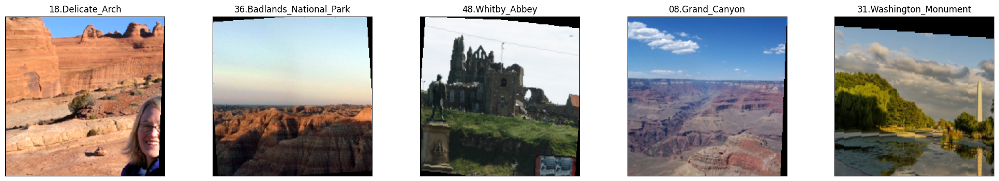

In [18]:
%matplotlib inline
from src.data import visualize_one_batch, get_data_loaders

# use get_data_loaders to get the data_loaders dictionary. Use a batch_size
# of 5, a validation size of 0.01 and num_workers=-1 (all CPUs)
data_loaders = get_data_loaders(batch_size= 15, valid_size= 0.01, num_workers= -1)

visualize_one_batch(data_loaders, 5)

### Defining our CNN model from scratch

Here, we define our CNN model with 5 convolutional layers and 3 Fully connected layers. The first 3 convolutional layers contain ReLU activations, whereas the final two convolutional layers as well as the fully connected layers consist of LeakyReLU activations. We also have max pooling layers for all convolutional layers and also, perform batch normalization for some convolutional layers and all fully connected layers to normalize the intermediate outputs of each layer within a batch during training, making the optimization process more stable and faster. Some layers do not perform batch normalization. This is mostly for empirical reasons as the primary goal of the model is obtain an accuracy of around 50%. 

We also have added a few dropout layers to hopefully reduce overfitting. The choice of 5 convolutional layers and 3 FC layers was empirical once again as this model configuration yielded better accuracy during validation and testing. I did some research into selecting values for various layers and found this article to be very useful https://towardsdatascience.com/a-guide-to-an-efficient-way-to-build-neural-network-architectures-part-ii-hyper-parameter-42efca01e5d7

In [19]:
%%file src/model.py
import torch
import torch.nn as nn
import torch.nn.functional as F


# define the CNN architecture
class Model(nn.Module):
    def __init__(self, num_classes: int = 1000, dropout: float = 0.7, configOption: int = 0) -> None:

        super().__init__()

        # Define a CNN architecture.    
        if (configOption == 0):
            self.model = nn.Sequential(
                nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2, 2),
                nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2, 2),
                nn.BatchNorm2d(32),
                nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2, 2),
                nn.BatchNorm2d(64),       
                nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
                nn.LeakyReLU(negative_slope=0.2),
                nn.MaxPool2d(2, 2),
                nn.BatchNorm2d(128),
                nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
                nn.LeakyReLU(negative_slope=0.2),
                nn.MaxPool2d(2, 2),
                nn.BatchNorm2d(256), 
                nn.Flatten(),
                nn.Dropout(p=dropout),
                nn.Linear(7 * 7 * 256, out_features=500),
                nn.LeakyReLU(negative_slope=0.2),
                nn.BatchNorm1d(500),
                nn.Dropout(p=dropout),
                nn.Linear(500, out_features=256),
                nn.LeakyReLU(negative_slope=0.2),
                nn.BatchNorm1d(256),
                nn.Dropout(p=dropout),
                nn.Linear(256, num_classes)
            )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # process the input tensor through the
        # feature extractor, the pooling and the final linear
        # layers (if appropriate for the architecture chosen)
        
        return self.model(x)


######################################################################################
#                                     TESTS
######################################################################################
import pytest


@pytest.fixture(scope="session")
def data_loaders():
    from .data import get_data_loaders

    return get_data_loaders(batch_size=2)


def test_model_construction(data_loaders):

    model = Model(num_classes=23, dropout=0.3)

    dataiter = iter(data_loaders["train"])
    images, labels = next(dataiter)#dataiter.next()

    out = model(images)

    assert isinstance(
        out, torch.Tensor
    ), "The output of the .forward method should be a Tensor of size ([batch_size], [n_classes])"

    assert out.shape == torch.Size(
        [2, 23]
    ), f"Expected an output tensor of size (2, 23), got {out.shape}"



Writing src/model.py


In [20]:
!pytest -vv src/model.py

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 1 item                                                               

src/model.py::test_model_construction PASSED                             [100%]

============================== 1 passed in 10.96s ==============================


### Optimizer

In [17]:
%%file src/optimization.py
import torch
import torch.nn as nn
import torch.optim


def get_loss():
    """
    Get an instance of the CrossEntropyLoss (useful for classification),
    optionally moving it to the GPU if use_cuda is set to True
    """

    # select a loss appropriate for classification
    loss  = nn.CrossEntropyLoss()

    return loss


def get_optimizer(
    model: nn.Module,
    optimizer: str = "SGD",
    learning_rate: float = 0.01,
    momentum: float = 0.5,
    weight_decay: float = 0,
):
    """
    Returns an optimizer instance

    :param model: the model to optimize
    :param optimizer: one of 'SGD' or 'Adam'
    :param learning_rate: the learning rate
    :param momentum: the momentum (if the optimizer uses it)
    :param weight_decay: regularization coefficient
    """
    if optimizer.lower() == "sgd":
        # create an instance of the SGD
        # optimizer. Use the input parameters learning_rate, momentum
        # and weight_decay
        opt = torch.optim.SGD(
            model.parameters(), learning_rate, momentum, weight_decay=weight_decay
        )

    elif optimizer.lower() == "adam":
        #: create an instance of the Adam
        # optimizer. Use the input parameters learning_rate, momentum
        # and weight_decay
        opt = torch.optim.Adam(
            model.parameters(), learning_rate, weight_decay=weight_decay
        )
    else:
        raise ValueError(f"Optimizer {optimizer} not supported")

    return opt


######################################################################################
#                                     TESTS
######################################################################################
import pytest


@pytest.fixture(scope="session")
def fake_model():
    return nn.Linear(16, 256)


def test_get_loss():

    loss = get_loss()

    assert isinstance(
        loss, nn.CrossEntropyLoss
    ), f"Expected cross entropy loss, found {type(loss)}"


def test_get_optimizer_type(fake_model):

    opt = get_optimizer(fake_model)

    assert isinstance(opt, torch.optim.SGD), f"Expected SGD optimizer, got {type(opt)}"


def test_get_optimizer_is_linked_with_model(fake_model):

    opt = get_optimizer(fake_model)

    assert opt.param_groups[0]["params"][0].shape == torch.Size([256, 16])


def test_get_optimizer_returns_adam(fake_model):

    opt = get_optimizer(fake_model, optimizer="adam")

    assert opt.param_groups[0]["params"][0].shape == torch.Size([256, 16])
    assert isinstance(opt, torch.optim.Adam), f"Expected SGD optimizer, got {type(opt)}"


def test_get_optimizer_sets_learning_rate(fake_model):

    opt = get_optimizer(fake_model, optimizer="adam", learning_rate=0.123)

    assert (
        opt.param_groups[0]["lr"] == 0.123
    ), "get_optimizer is not setting the learning rate appropriately. Check your code."


def test_get_optimizer_sets_momentum(fake_model):

    opt = get_optimizer(fake_model, optimizer="SGD", momentum=0.123)

    assert (
        opt.param_groups[0]["momentum"] == 0.123
    ), "get_optimizer is not setting the momentum appropriately. Check your code."


def test_get_optimizer_sets_weight_decat(fake_model):

    opt = get_optimizer(fake_model, optimizer="SGD", weight_decay=0.123)

    assert (
        opt.param_groups[0]["weight_decay"] == 0.123
    ), "get_optimizer is not setting the weight_decay appropriately. Check your code."

Overwriting src/optimization.py


Using adam and SGD optimizers here. I also picked Cross Entropy Loss as the loss function as it seemed pretty standard for the given multi-label classification problem

In [22]:
!pytest -vv src/optimization.py -k get_loss

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 7 items / 6 deselected / 1 selected                                  

src/optimization.py::test_get_loss PASSED                                [100%]

======================= 1 passed, 6 deselected in 0.69s ========================


In [23]:
!pytest -vv src/optimization.py -k get_optimizer

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 7 items / 1 deselected / 6 selected                                  

src/optimization.py::test_get_optimizer_type PASSED                      [ 16%]
src/optimization.py::test_get_optimizer_is_linked_with_model PASSED      [ 33%]
src/optimization.py::test_get_optimizer_returns_adam PASSED              [ 50%]
src/optimization.py::test_get_optimizer_sets_learning_rate PASSED        [ 66%]
src/optimization.py::test_get_optimizer_sets_momentum PASSED             [ 83%]
src/optimization.py::test_get_optimizer_sets_weight_decat PASSED         [100%]

======================= 6 passed, 1 deselected in 0.78s ========================


### Train and Validate the Model

In [19]:
%%file src/train.py
import tempfile

import torch.nn as nn
import torch
import numpy as np
from livelossplot import PlotLosses
from livelossplot.outputs import MatplotlibPlot
from tqdm import tqdm
from src.helpers import after_subplot


def train_one_epoch(train_dataloader, model, optimizer, loss):
    """
    Performs one train_one_epoch epoch
    """

    if torch.cuda.is_available():
        # transfer the model to the GPU
        # use .cuda()
        model.cuda()

    #set the model to training mode
    model.train()
    train_loss = 0.0

    for batch_idx, (data, target) in tqdm(
        enumerate(train_dataloader),
        desc="Training",
        total=len(train_dataloader),
        leave=True,
        ncols=80,
    ):
        # move data to GPU
        if torch.cuda.is_available():
            data, target = data.cuda(), target.cuda()

        # 1. clear the gradients of all optimized variables
        optimizer.zero_grad()
        # 2. forward pass: compute predicted outputs by passing inputs to the model
        output  = model.forward(data) #
        # 3. calculate the loss
        loss_value  = loss(output, target) 
        # 4. backward pass: compute gradient of the loss with respect to model parameters
        loss_value.backward()
        # 5. perform a single optimization step (parameter update)
        optimizer.step()
        

        # update average training loss
        train_loss = train_loss + (
            (1 / (batch_idx + 1)) * (loss_value.data.item() - train_loss)
        )

    return train_loss

def valid_one_epoch(valid_dataloader, model, loss):
    """
    Validate at the end of one epoch
    """

    with torch.no_grad():

        # set the model to evaluation mode
        model.eval()

        if torch.cuda.is_available():
            model.cuda()

        valid_loss = 0.0
        for batch_idx, (data, target) in tqdm(
            enumerate(valid_dataloader),
            desc="Validating",
            total=len(valid_dataloader),
            leave=True,
            ncols=80,
        ):
            # move data to GPU
            if torch.cuda.is_available():
                data, target = data.cuda(), target.cuda()

            # 1. forward pass: compute predicted outputs by passing inputs to the model
            output  = model.forward(data)
            # 2. calculate the loss
            loss_value  = loss(output, target)

            # Calculate average validation loss
            valid_loss = valid_loss + (
                (1 / (batch_idx + 1)) * (loss_value.data.item() - valid_loss)
            )

    return valid_loss



def optimize(data_loaders, model, optimizer, loss, n_epochs, save_path, interactive_tracking=False, scheduler="ReduceLROnPlateau"):
    # initialize tracker for minimum validation loss
    if interactive_tracking:
        liveloss = PlotLosses(outputs=[MatplotlibPlot(after_subplot=after_subplot)])
    else:
        liveloss = None

    valid_loss_min = None
    logs = {}

    # Learning rate scheduler: setup a learning rate scheduler that
    # reduces the learning rate when the validation loss reaches a
    # plateau
    # look here: 
    # https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
    if (scheduler == "ReduceLROnPlateau"):
        scheduler  = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10, threshold=0.0001, threshold_mode='rel', cooldown=0, min_lr=0, eps=1e-08, verbose=False)# YOUR CODE HERE
    elif (scheduler == "StepLR"):
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

    for epoch in range(1, n_epochs + 1):

        train_loss = train_one_epoch(
            data_loaders["train"], model, optimizer, loss
        )

        valid_loss = valid_one_epoch(data_loaders["valid"], model, loss)

        # print training/validation statistics
        print(
            "Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}".format(
                epoch, train_loss, valid_loss
            )
        )

        # If the validation loss decreases by more than 1%, save the model
        if valid_loss_min is None or (
                (valid_loss_min - valid_loss) / valid_loss_min > 0.01
        ):
            print(f"New minimum validation loss: {valid_loss:.6f}. Saving model ...")

            # Save the weights to save_path
            torch.save(model.state_dict(), save_path)

            valid_loss_min = valid_loss

        # Update learning rate, i.e., make a step in the learning rate scheduler
        if (scheduler == "ReduceLROnPlateau"):
            scheduler.step(valid_loss_min)
        elif (scheduler == "StepLR"):
            scheduler.step()
        # Log the losses and the current learning rate
        if interactive_tracking:
            logs["loss"] = train_loss
            logs["val_loss"] = valid_loss
            logs["lr"] = optimizer.param_groups[0]["lr"]

            liveloss.update(logs)
            liveloss.send()


def one_epoch_test(test_dataloader, model, loss):
    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    # set the module to evaluation mode
    with torch.no_grad():

        # set the model to evaluation mode
        model.eval()

        if torch.cuda.is_available():
            model = model.cuda()

        for batch_idx, (data, target) in tqdm(
                enumerate(test_dataloader),
                desc='Testing',
                total=len(test_dataloader),
                leave=True,
                ncols=80
        ):
            # move data to GPU
            if torch.cuda.is_available():
                data, target = data.cuda(), target.cuda()

            # 1. forward pass: compute predicted outputs by passing inputs to the model
            logits  = model.forward(data) 
            # 2. calculate the loss
            loss_value  = loss(logits, target)

            # update average test loss
            test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss_value.data.item() - test_loss))

            # convert logits to predicted class
            # the predicted class is the index of the max of the logits
            pred  = torch.argmax(logits, dim=1)

            # compare predictions to true label
            correct += torch.sum(torch.squeeze(pred.eq(target.data.view_as(pred))).cpu())
            total += data.size(0)

    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

    return test_loss


    
######################################################################################
#                                     TESTS
######################################################################################
import pytest


@pytest.fixture(scope="session")
def data_loaders():
    from .data import get_data_loaders

    return get_data_loaders(batch_size=57, limit=200, valid_size=0.5, num_workers=0)


@pytest.fixture(scope="session")
def optim_objects():
    from src.optimization import get_optimizer, get_loss
    from src.model import Model

    model = Model(57)

    return model, get_loss(), get_optimizer(model)


def test_train_one_epoch(data_loaders, optim_objects):

    model, loss, optimizer = optim_objects

    for _ in range(2):
        lt = train_one_epoch(data_loaders['train'], model, optimizer, loss)
        assert not np.isnan(lt), "Training loss is nan"


def test_valid_one_epoch(data_loaders, optim_objects):

    model, loss, optimizer = optim_objects

    for _ in range(2):
        lv = valid_one_epoch(data_loaders["valid"], model, loss)
        assert not np.isnan(lv), "Validation loss is nan"

def test_optimize(data_loaders, optim_objects):

    model, loss, optimizer = optim_objects

    with tempfile.TemporaryDirectory() as temp_dir:
        optimize(data_loaders, model, optimizer, loss, 2, f"{temp_dir}/hey.pt")


def test_one_epoch_test(data_loaders, optim_objects):

    model, loss, optimizer = optim_objects

    tv = one_epoch_test(data_loaders["test"], model, loss)
    assert not np.isnan(tv), "Test loss is nan"

Overwriting src/train.py


### Methodology (For train / Optimize methods)

Kind of interesting that the model can be set to train or eval mode. For the optimize routine, a learning rate scheduler was also setup, which reduces the learning rate when the validation loss reaches a plateau. This was something new to me and it seemed like a very neat technique. I experimented with a few types of scheduler implementations in pytorch including `ReduceLROnPlateau` and the `StepLR`

In [38]:
!pytest -vv src/train.py -k train_one_epoch

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 4 items / 3 deselected / 1 selected                                  

src/train.py::test_train_one_epoch PASSED                                [100%]

======================= 1 passed, 3 deselected in 7.68s ========================


In [39]:
!pytest -vv src/train.py -k valid_one_epoch

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 4 items / 3 deselected / 1 selected                                  

src/train.py::test_valid_one_epoch PASSED                                [100%]

======================= 1 passed, 3 deselected in 4.28s ========================


In [40]:
!pytest -vv src/train.py -k optimize

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 4 items / 3 deselected / 1 selected                                  

src/train.py::test_optimize PASSED                                       [100%]

======================= 1 passed, 3 deselected in 12.15s =======================


In [41]:
!pytest -vv src/train.py -k one_epoch_test

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 4 items / 3 deselected / 1 selected                                  

src/train.py::test_one_epoch_test PASSED                                 [100%]

======================= 1 passed, 3 deselected in 3.44s ========================


### Putting everything together

In [42]:
batch_size = 32        # size of the minibatch for stochastic gradient descent (or Adam)
valid_size = 0.2       # fraction of the training data to reserve for validation
num_epochs = 50       # number of epochs for training
num_classes = 57       # number of classes. Do not change this
dropout = 0.1          # dropout for our model
learning_rate = 0.1  # Learning rate for SGD (or Adam)
opt = 'sgd'            # optimizer. 'sgd' or 'adam'
weight_decay = 0.001    # regularization. Increase this to combat overfitting

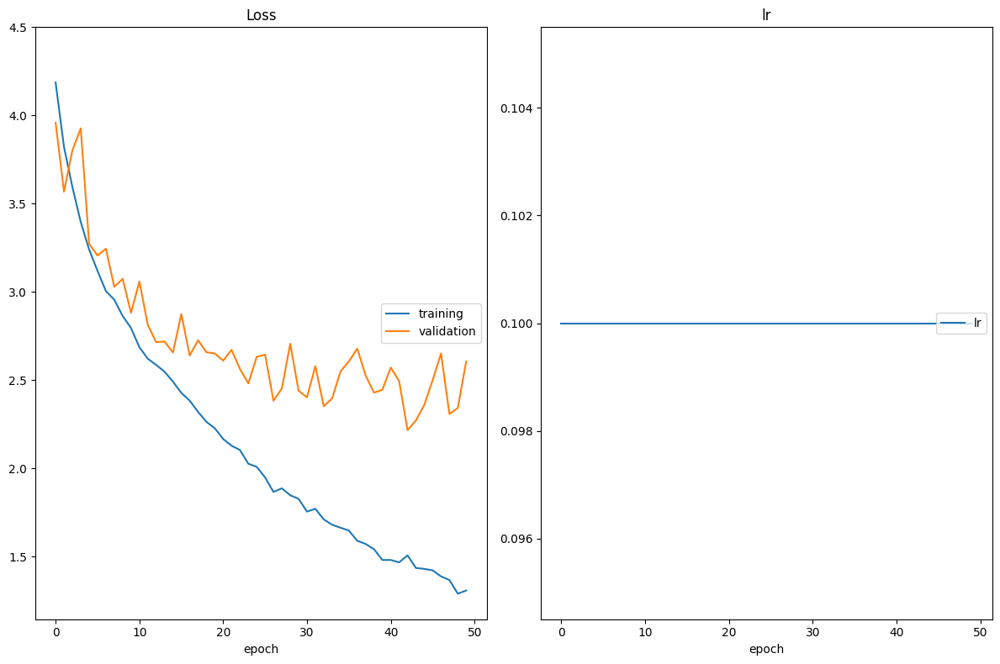

In [43]:
from src.data import get_data_loaders
from src.train import optimize
from src.optimization import get_optimizer, get_loss
from src.model import Model

# get the data loaders using batch_size and valid_size defined in the previous
# cell
data_loaders = get_data_loaders(batch_size, valid_size) #

# instance model MyModel with num_classes and drouput defined in the previous
# cell
model = Model(num_classes, dropout) # 

# Get the optimizer using get_optimizer and the model you just created, the learning rate,
# the optimizer and the weight decay specified in the previous cell
optimizer = get_optimizer(model, learning_rate=learning_rate, optimizer=opt, weight_decay=weight_decay) 

# Get the loss using get_loss
loss = get_loss()

optimize(
    data_loaders,
    model,
    optimizer,
    loss,
    n_epochs=num_epochs,
    save_path='checkpoints/best_val_loss.pt',
    interactive_tracking=True
)

The validation loss seems to come down to a respectable number in the run described above. However, during other previous runs we kept getting validation losses > 3.0 and test accuracies < 50% for this particular CNN architecture. After trying a bunch of hyperparameter tunings, we figured that the image transformations were causing the issue. We were flipping images randomly during training and once we removed that transform, the model performed much better. Nt sure what the cause could be yet, but it was something interesting.

### Testing the Model against the Test Set - Original model

In [44]:
# load the model that got the best validation accuracy
from src.train import one_epoch_test
from src.model import Model
import torch

model = Model(num_classes=num_classes, dropout=dropout)

#load the weights in 'checkpoints/best_val_loss.pt'
checkpoint_path = 'checkpoints/best_val_loss.pt'
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)


# Run test
one_epoch_test(data_loaders['test'], model, loss)

Testing: 100%|██████████████████████████████████| 45/45 [00:13<00:00,  3.43it/s]

Test Loss: 2.050262


Test Accuracy: 49% (704/1425)


2.0502624127599933

Almost there got to increase the accuracy to hit our 50% benchmark.

### Let's train for longer (Modify n_epochs : 50 to 70)

In [46]:
batch_size = 32        # size of the minibatch for stochastic gradient descent (or Adam)
valid_size = 0.2       # fraction of the training data to reserve for validation
num_epochs = 70       # number of epochs for training
num_classes = 57       # number of classes. Do not change this
dropout = 0.1          # dropout for our model
learning_rate = 0.1  # Learning rate for SGD (or Adam)
opt = 'sgd'            # optimizer. 'sgd' or 'adam'
weight_decay = 0.001    # regularization. Increase this to combat overfitting

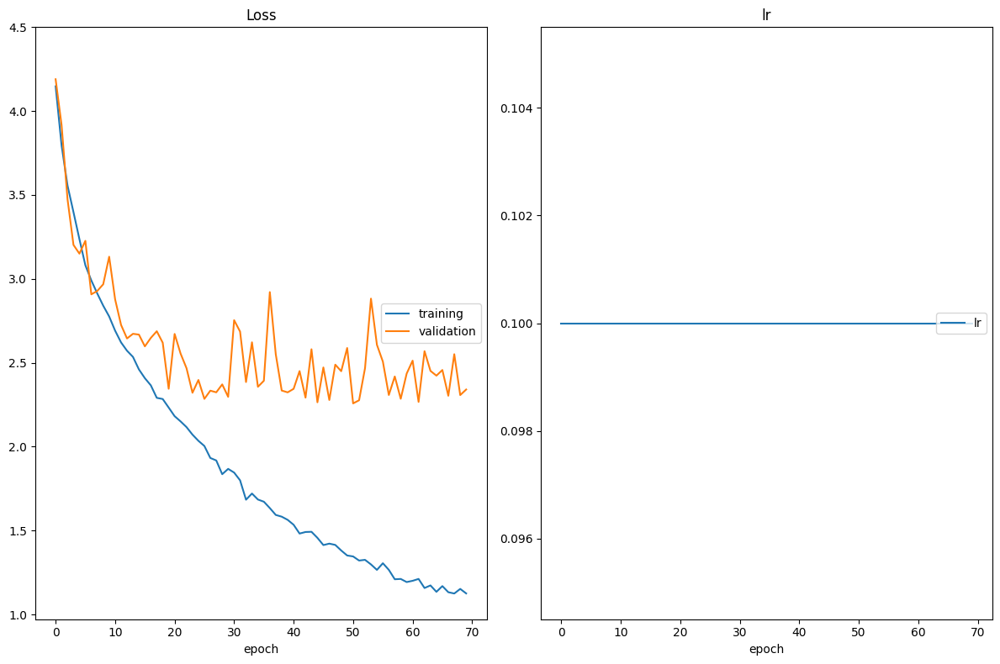

In [47]:
from src.data import get_data_loaders
from src.train import optimize
from src.optimization import get_optimizer, get_loss
from src.model import Model

# get the data loaders using batch_size and valid_size defined in the previous
# cell
data_loaders = get_data_loaders(batch_size, valid_size) #

# instance model MyModel with num_classes and drouput defined in the previous
# cell
model = Model(num_classes, dropout) # 

# Get the optimizer using get_optimizer and the model you just created, the learning rate,
# the optimizer and the weight decay specified in the previous cell
optimizer = get_optimizer(model, learning_rate=learning_rate, optimizer=opt, weight_decay=weight_decay) 

# Get the loss using get_loss
loss = get_loss()

optimize(
    data_loaders,
    model,
    optimizer,
    loss,
    n_epochs=num_epochs,
    save_path='checkpoints/best_val_loss_default_70_epochs.pt',
    interactive_tracking=True
)

In [48]:
# load the model that got the best validation accuracy
from src.train import one_epoch_test
from src.model import Model
import torch

model = Model(num_classes=num_classes, dropout=dropout)

#load the weights in 'checkpoints/best_val_loss.pt'
checkpoint_path = 'checkpoints/best_val_loss_default_70_epochs.pt'
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)


# Run test
one_epoch_test(data_loaders['test'], model, loss)

Testing: 100%|██████████████████████████████████| 45/45 [00:13<00:00,  3.46it/s]

Test Loss: 2.078365


Test Accuracy: 51% (727/1425)


2.0783652007579807

Awesome! The test accuracy is higher than 50%. Our model should be ready for export for use in production (our app).

### Exporting the model

In [49]:
%%file src/predictor.py
import os

import torch
import numpy as np
from torch import nn
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import datasets
import torchvision.transforms as T
from .helpers import get_data_location


class Predictor(nn.Module):

    def __init__(self, model, class_names, mean, std):
        super().__init__()

        self.model = model.eval()
        self.class_names = class_names

        # We use nn.Sequential and not nn.Compose because the former
        # is compatible with torch.script, while the latter isn't
        self.transforms = nn.Sequential(
            T.Resize([256, ], antialias=True),  # We use single int value inside a list due to torchscript type restrictions
            T.CenterCrop(224),
            T.ConvertImageDtype(torch.float),
            T.Normalize(mean.tolist(), std.tolist())
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        with torch.no_grad():
            # 1. apply transforms
            x  = self.transforms(x) 
            # 2. get the logits
            x  = self.model(x) 
            # 3. apply softmax
            #softmax = nn.Softmax(dim=1) #cannot instantiate softmax in script fn error
            # apply softmax across dim=1
            #x = softmax(x) 
            x  =  F.softmax(x, dim=1)
            return x


def predictor_test(test_dataloader, model_reloaded):
    """
    Test the predictor. Since the predictor does not operate on the same tensors
    as the non-wrapped model, we need a specific test function (can't use one_epoch_test)
    """

    folder = get_data_location()
    test_data = datasets.ImageFolder(os.path.join(folder, "test"), transform=T.ToTensor())

    pred = []
    truth = []
    for x in tqdm(test_data, total=len(test_dataloader.dataset), leave=True, ncols=80):
        softmax = model_reloaded(x[0].unsqueeze(dim=0))

        idx = softmax.squeeze().argmax()

        pred.append(int(x[1]))
        truth.append(int(idx))

    pred = np.array(pred)
    truth = np.array(truth)

    print(f"Accuracy: {(pred==truth).sum() / pred.shape[0]}")

    return truth, pred


######################################################################################
#                                     TESTS
######################################################################################
import pytest


@pytest.fixture(scope="session")
def data_loaders():
    from .data import get_data_loaders

    return get_data_loaders(batch_size=2)


def test_model_construction(data_loaders):

    from .model import Model
    from .helpers import compute_mean_and_std

    mean, std = compute_mean_and_std()

    model = Model(num_classes=3, dropout=0.3)

    dataiter = iter(data_loaders["train"])
    images, labels = next(dataiter)

    predictor = Predictor(model, class_names=['a', 'b', 'c'], mean=mean, std=std)

    out = predictor(images)

    assert isinstance(
        out, torch.Tensor
    ), "The output of the .forward method should be a Tensor of size ([batch_size], [n_classes])"

    assert out.shape == torch.Size(
        [2, 3]
    ), f"Expected an output tensor of size (2, 3), got {out.shape}"

    assert torch.isclose(
        out[0].sum(),
        torch.Tensor([1]).squeeze()
    ), "The output of the .forward method should be a softmax vector with sum = 1"

Writing src/predictor.py


In [51]:
!pytest -vv src/predictor.py

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 1 item                                                               

src/predictor.py::test_model_construction PASSED                         [100%]

============================== 1 passed in 10.86s ==============================


In [53]:
# NOTE: might need to restart the notebook before running this step
# If an error about RuntimeError: Can't redefine method: forward on class
# restart your notebook then execute only this cell
from src.predictor import Predictor
from src.helpers import compute_mean_and_std
from src.model import Model
from src.data import get_data_loaders
import torch

data_loaders = get_data_loaders(batch_size=1)

# First let's get the class names from our data loaders
class_names = data_loaders["train"].dataset.classes

# Then let's move the model_transfer to the CPU
# (we don't need GPU for inference)
model = Model(num_classes=57, dropout=0.5).cpu()

# Let's make sure we use the right weights by loading the
# best weights we have found during training
# NOTE: remember to use map_location='cpu' so the weights
# are loaded on the CPU (and not the GPU)
checkpoint = torch.load('checkpoints/best_val_loss_default_70_epochs.pt', map_location='cpu')
model.load_state_dict(checkpoint)

# Let's wrap our model using the predictor class
mean, std = compute_mean_and_std()
predictor = Predictor(model, class_names, mean, std).cpu()

# Export using torch.jit.script
scripted_predictor = torch.jit.script(predictor)

scripted_predictor.save("checkpoints/original_exported.pt")

Reusing cached mean and std
Dataset mean: tensor([0.4696, 0.4770, 0.4705]), std: tensor([0.2678, 0.2682, 0.2961])
Reusing cached mean and std


Make sure the exported model has the same performance as the original one by reloading it and testing it

In [54]:
import torch

# Load using torch.jit.load
model_reloaded =  torch.jit.load("checkpoints/original_exported.pt")

In [55]:
from src.predictor import predictor_test

pred, truth = predictor_test(data_loaders['test'], model_reloaded)

100%|███████████████████████████████████████| 1425/1425 [00:32<00:00, 43.92it/s]

Accuracy: 0.5108771929824562


The accuracy of 0.51 matches the accuracy we got during our first inference. So, the model has been exported correctly.

Finally, let's have a look at the confusion matrix of the model we are going to use in production:

In [56]:
!pip install seaborn --user


[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


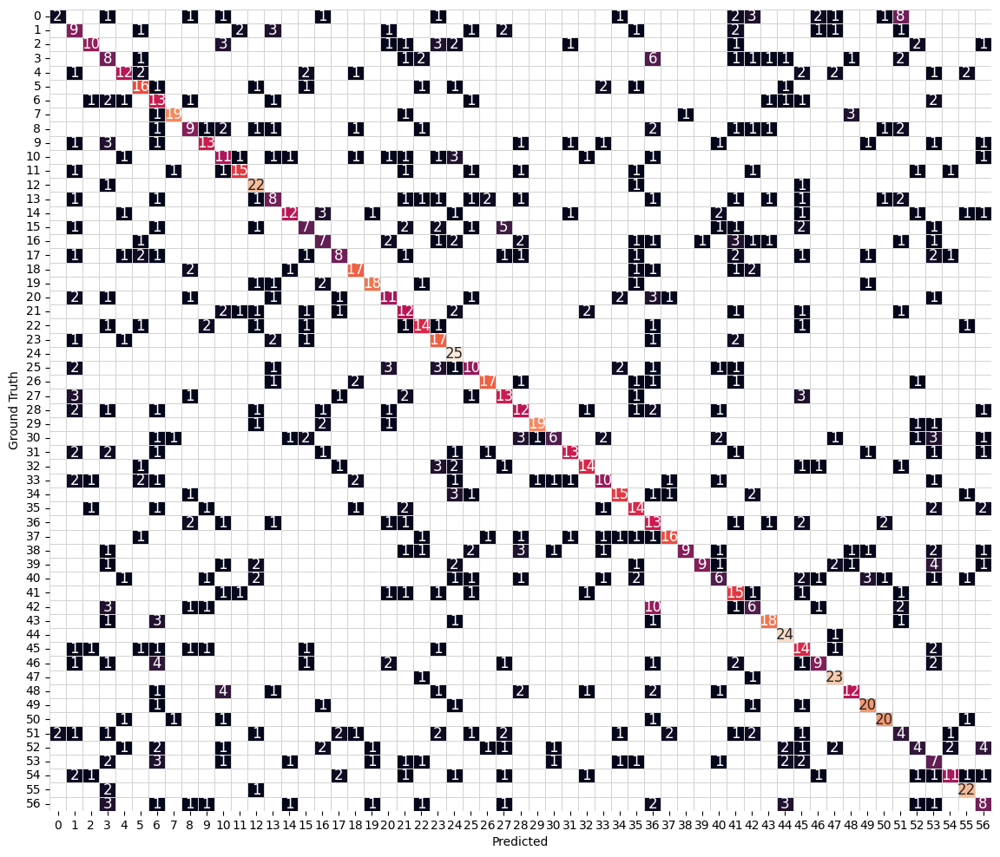

In [57]:
from src.helpers import plot_confusion_matrix

plot_confusion_matrix(pred, truth)

This confusion matrix obtained after performing inference on our base model shows various labels with significant number of incorrect predictions. Label 44 (Trevi Fountain) had 24/25 correct predictions.

## Testing the App (Using our own model)

In [58]:
from ipywidgets import VBox, Button, FileUpload, Output, Label
from PIL import Image
from IPython.display import display
import io
import numpy as np
import torchvision
import torchvision.transforms as T
import torch

# Decide which model you want to use among the ones exported
learn_inf = torch.jit.load("checkpoints/original_exported.pt")
out_pl = Output()

def on_click_classify(change):
    try:
        with out_pl:
            fn = io.BytesIO(btn_upload.value[-1].content)
            img = Image.open(fn)
            #img.load()
            out_pl.clear_output()
            c = img.copy()
            ratio = img.size[0] / img.size[1]
            c.thumbnail([ratio * 200, 200])
            display(c)

            timg = T.ToTensor()(img).unsqueeze_(0)
    
            # Calling the model
            softmax = learn_inf(timg).data.cpu().numpy().squeeze()
            
            # Get the indexes of the classes ordered by softmax
            # (larger first)
            idxs = np.argsort(softmax)[::-1]
            
            # Loop over the classes with the largest softmax
            for i in range(5):
                # Get softmax value
                p = softmax[idxs[i]]
            
                # Get class name
                landmark_name = learn_inf.class_names[idxs[i]]
                
                labels[i].value = f"{landmark_name} (prob: {p:.2f})"
                #print(labels[i].value)
        
    except Exception as e:
        print(f"An error occurred: {e}")

# Putting back btn_upload to a widget for next cell
btn_upload = FileUpload()

btn_run = Button(description="Classify")
btn_run.on_click(on_click_classify)

labels = []
for _ in range(5):
    labels.append(Label())

out_pl.clear_output()

wgs = [Label("Please upload a picture of a landmark"), btn_upload, btn_run, out_pl]
wgs.extend(labels)

VBox(wgs)

### More Inferences (Deprecated)

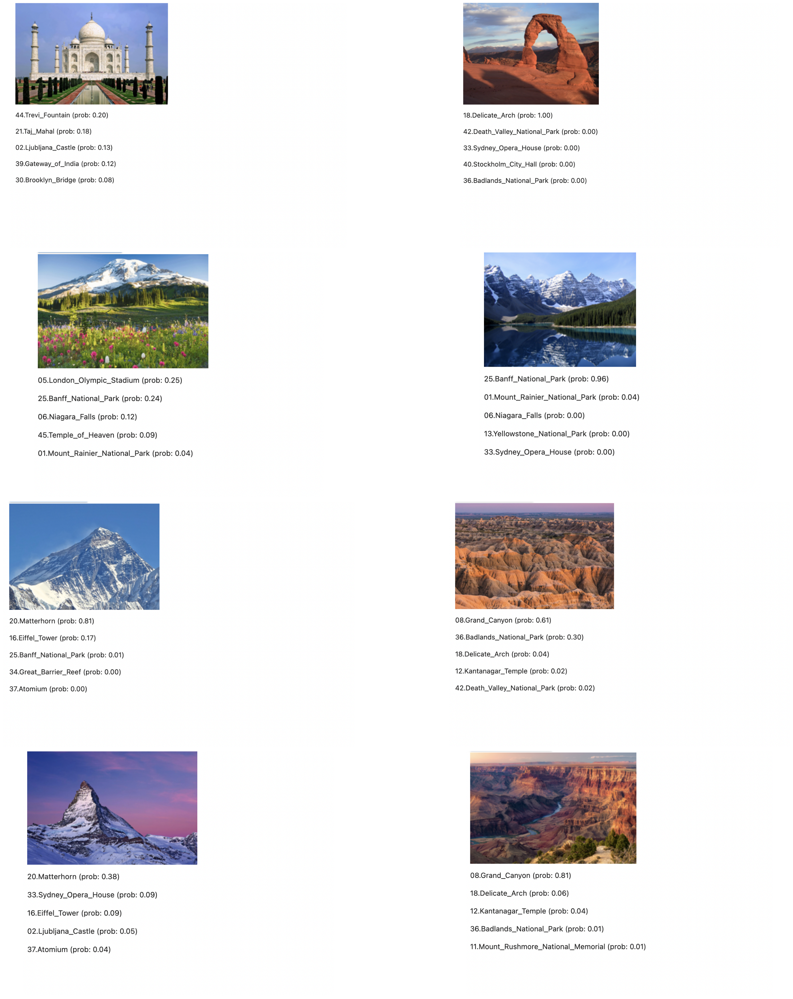

In [52]:
plot_inferences("/Users/yuniktamrakar/Desktop/ML-Final-Original-Inferences")

The model we created from scratch obtains an accuracy of 51% which is higher than the threshold of 50% we set during the project proposal.  However, there are some glaring misclassifications as well. The model mistook Taj Mahal as Trevi fountain. Also, the Badlands was confused with the Grand Canyon and Grand canyon seems to be commonly classified as Kantanagar temple, which isn't all that surprising given that both landscapes are similar in some ways. I have seen humans getting confused with this example as well, so our model shouldn't be called out too much for this. Another rather odd prediction was Mt Rainier getting labeled as the London Olympic Stadium. Might have been logical to mistake Rainier for some mountainous landmark like Matterhorn or Banff; so seeing the olympic stadium as the prediction was rather surprising.

Nonetheless, the inference results are respectable, given the complexity of the task. We will look to further improve that accuracy by using transfer learning from a powerful pretrained model

## Transfer Learning

We are using the ResNet18 model as the baseline model that we can learn from using transfer learning.

In [69]:
%%file src/transfer.py
import torch
import torchvision
import torchvision.models as models
import torch.nn as nn


def get_model_transfer_learning(model_name="resnet18", n_classes=57):

    # Get the requested architecture
    if hasattr(models, model_name):

        model_transfer = getattr(models, model_name)(weights='ResNet18_Weights.DEFAULT')

    else:

        torchvision_major_minor = ".".join(torchvision.__version__.split(".")[:2])

        raise ValueError(f"Model {model_name} is not known. List of available models: "
                         f"https://pytorch.org/vision/{torchvision_major_minor}/models.html")

    # Freeze all parameters in the model
    # loop over all parameters. If "param" is one parameter,
    # "param.requires_grad = False" freezes it
    for name, param in model_transfer.named_parameters():
        if param.requires_grad:
            param.requires_grad = False #freeze

    # Add the linear layer at the end with the appropriate number of classes
    # 1. get numbers of features extracted by the backbone
    num_ftrs  = model_transfer.fc.in_features# 

    # 2. Create a new linear layer with the appropriate number of inputs and
    #    outputs
    model_transfer.fc = nn.Linear(num_ftrs, n_classes)

    return model_transfer


######################################################################################
#                                     TESTS
######################################################################################
import pytest


@pytest.fixture(scope="session")
def data_loaders():
    from .data import get_data_loaders

    return get_data_loaders(batch_size=2)


def test_get_model_transfer_learning(data_loaders):

    model = get_model_transfer_learning(n_classes=23)

    dataiter = iter(data_loaders["train"])
    images, labels = next(dataiter)

    out = model(images)

    assert isinstance(
        out, torch.Tensor
    ), "The output of the .forward method should be a Tensor of size ([batch_size], [n_classes])"

    assert out.shape == torch.Size(
        [2, 23]
    ), f"Expected an output tensor of size (2, 23), got {out.shape}"

Overwriting src/transfer.py


ResNet18 has been used as the base model for transfer learning. We decided to use ResNet18 for the base of the model, since it does fairly well on ImageNet and isn't all that large of a model. Also, since ResNet18 was trained for the ImageNet task, it seems apt for use in this landmark classification task, since both ImageNet and this landmark task use images of natural scenes. Here, we freeze all the parameters in the model and ultimately add a fully connected layer at the end with the correct number of outputs.

In [70]:
!pytest -vv src/transfer.py

============================= test session starts ==============================
platform darwin -- Python 3.10.3, pytest-7.4.3, pluggy-1.3.0 -- /Users/yuniktamrakar/.pyenv/versions/3.10.3/bin/python3.10
cachedir: .pytest_cache
rootdir: /Users/yuniktamrakar/Documents/CS-535-Sp24/TripRecs
plugins: anyio-3.7.1
collected 1 item                                                               

src/transfer.py::test_get_model_transfer_learning PASSED                 [100%]

============================== 1 passed in 11.01s ==============================


In [1]:
batch_size = 64  # size of the minibatch for stochastic gradient descent (or Adam)
valid_size = 0.2  # fraction of the training data to reserve for validation
num_epochs = 70  # number of epochs for training
num_classes = 57  # number of classes. Do not change this
learning_rate = 0.001  # Learning rate for SGD (or Adam)
opt = 'adam'      # optimizer. 'sgd' or 'adam'
weight_decay = 0.001 # regularization. Increase this to combat overfitting

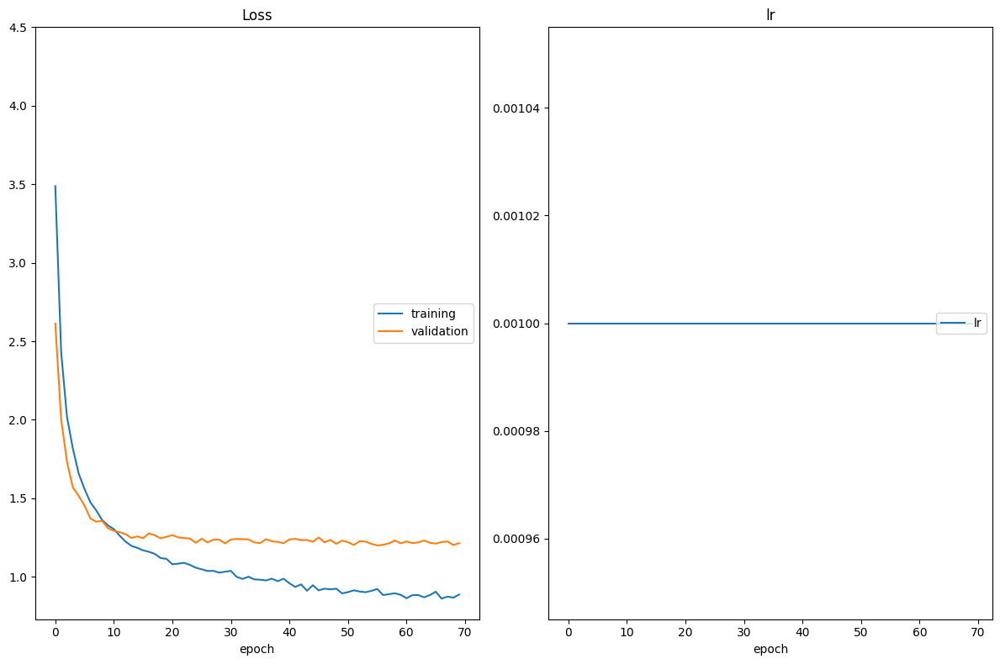

In [2]:
from src.data import get_data_loaders
from src.optimization import get_optimizer, get_loss
from src.train import optimize
from src.transfer import get_model_transfer_learning

# Get a model using get_model_transfer_learning. Use one of the names reported here:
# https://pytorch.org/vision/0.10/models.html
# For example, if you want to load ResNet 18, use "resnet18"
# NOTE: use the hyperparameters defined in the previous cell, do NOT copy/paste the
# values
model_transfer = get_model_transfer_learning("resnet18") 

# train the model
data_loaders = get_data_loaders(batch_size=batch_size)
optimizer = get_optimizer(
    model_transfer,
    learning_rate=learning_rate,
    optimizer=opt,
    weight_decay=weight_decay,
)
loss = get_loss()

optimize(
    data_loaders,
    model_transfer,
    optimizer,
    loss,
    n_epochs=num_epochs,
    save_path="checkpoints/model_transfer.pt",
    interactive_tracking=True
)

### Test the Model

In [3]:
import torch
from src.train import one_epoch_test
from src.transfer import get_model_transfer_learning

model_transfer = get_model_transfer_learning("resnet18", n_classes=num_classes)
# Load saved weights
model_transfer.load_state_dict(torch.load('checkpoints/model_transfer.pt'))

one_epoch_test(data_loaders['test'], model_transfer, loss)

Testing: 100%|██████████████████████████████████| 23/23 [00:42<00:00,  1.85s/it]

Test Loss: 1.177942


Test Accuracy: 70% (1011/1425)


1.177942108848821

### Export the model

In [4]:
from src.predictor import Predictor
from src.helpers import compute_mean_and_std

# First let's get the class names from our data loaders
class_names = data_loaders["train"].dataset.classes

# Then let's move the model_transfer to the CPU
# (we don't need GPU for inference)
model_transfer = model_transfer.cpu()
# Let's make sure we use the right weights by loading the
# best weights we have found during training
# NOTE: remember to use map_location='cpu' so the weights
# are loaded on the CPU (and not the GPU)
model_transfer.load_state_dict(
    torch.load("checkpoints/model_transfer.pt", map_location="cpu")
)

# Let's wrap our model using the predictor class
mean, std = compute_mean_and_std()
predictor = Predictor(model_transfer, class_names, mean, std).cpu()

# Export using torch.jit.script
scripted_predictor = torch.jit.script(predictor)
scripted_predictor.save("checkpoints/transfer_exported.pt")

Reusing cached mean and std


100%|███████████████████████████████████████| 1425/1425 [00:48<00:00, 29.39it/s]


Accuracy: 0.7094736842105264


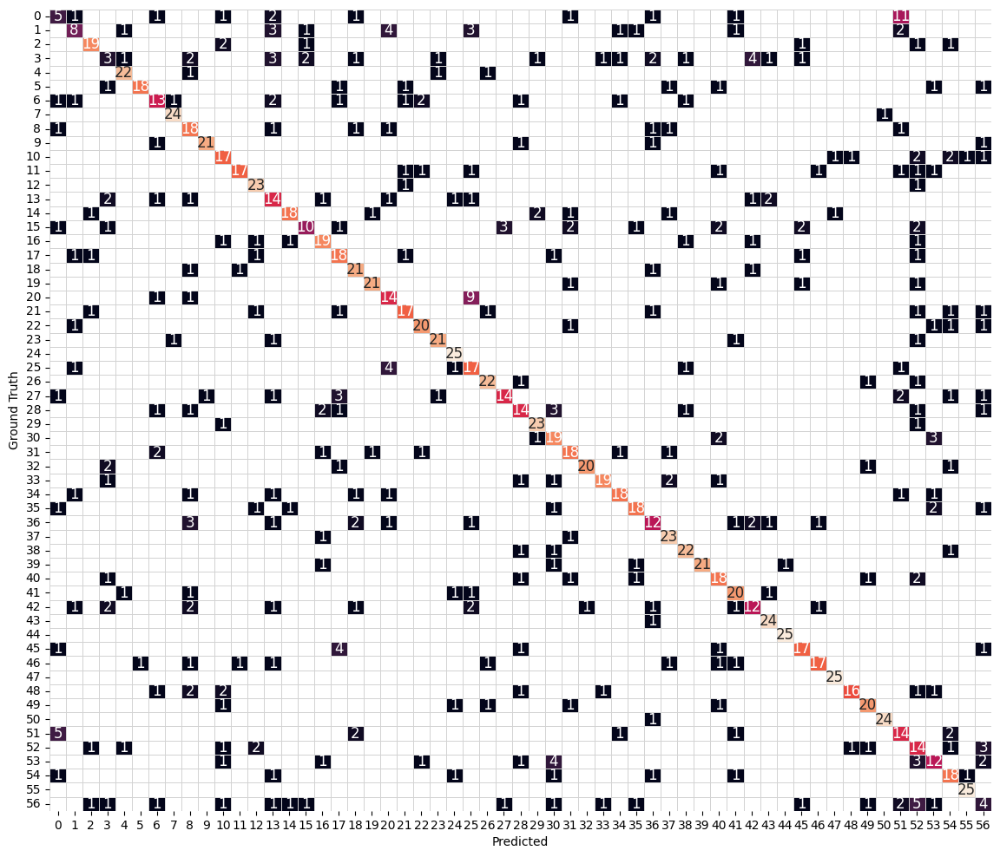

In [5]:
import torch
from src.predictor import predictor_test
from src.helpers import plot_confusion_matrix

model_reloaded = torch.jit.load("checkpoints/transfer_exported.pt")

pred, truth = predictor_test(data_loaders['test'], model_reloaded)

plot_confusion_matrix(pred, truth)

This confusion matrix obtained after performing inference on our transfer model appears to be notably cleaner than the one obtained from our base model. The model seems to do a better job at predicting most landmarks. 

## Testing the App (Using the Transfer Learning approach)

Once again, the app will show the top 5 classes that the model think are most relevant for the picture we have uploaded

In [6]:
from ipywidgets import VBox, Button, FileUpload, Output, Label
from PIL import Image
from IPython.display import display
import io
import numpy as np
import torchvision
import torchvision.transforms as T
import torch

# Decide which model you want to use among the ones exported
learn_inf = torch.jit.load("checkpoints/transfer_exported.pt")
out_pl = Output()

def on_click_classify(change):
    try:
        with out_pl:
            fn = io.BytesIO(btn_upload.value[-1].content)
            img = Image.open(fn)
            #img.load()
            out_pl.clear_output()
            c = img.copy()
            ratio = img.size[0] / img.size[1]
            c.thumbnail([ratio * 200, 200])
            display(c)

            timg = T.ToTensor()(img).unsqueeze_(0)
    
            # Calling the model
            softmax = learn_inf(timg).data.cpu().numpy().squeeze()
            
            # Get the indexes of the classes ordered by softmax
            # (larger first)
            idxs = np.argsort(softmax)[::-1]
            
            # Loop over the classes with the largest softmax
            for i in range(5):
                # Get softmax value
                p = softmax[idxs[i]]
            
                # Get class name
                landmark_name = learn_inf.class_names[idxs[i]]
                
                labels[i].value = f"{landmark_name} (prob: {p:.2f})"
                #print(labels[i].value)
        
    except Exception as e:
        print(f"An error occurred: {e}")

# Putting back btn_upload to a widget for next cell
btn_upload = FileUpload()

btn_run = Button(description="Classify")
btn_run.on_click(on_click_classify)

labels = []
for _ in range(5):
    labels.append(Label())

out_pl.clear_output()

wgs = [Label("Please upload a picture of a landmark"), btn_upload, btn_run, out_pl]
wgs.extend(labels)

VBox(wgs)

### More Inference Examples (Deprecated)

We see that our model (obtained after transfer learning) performs very well here. In fact, it gets the inference 100% correct. Now let us look at other examples

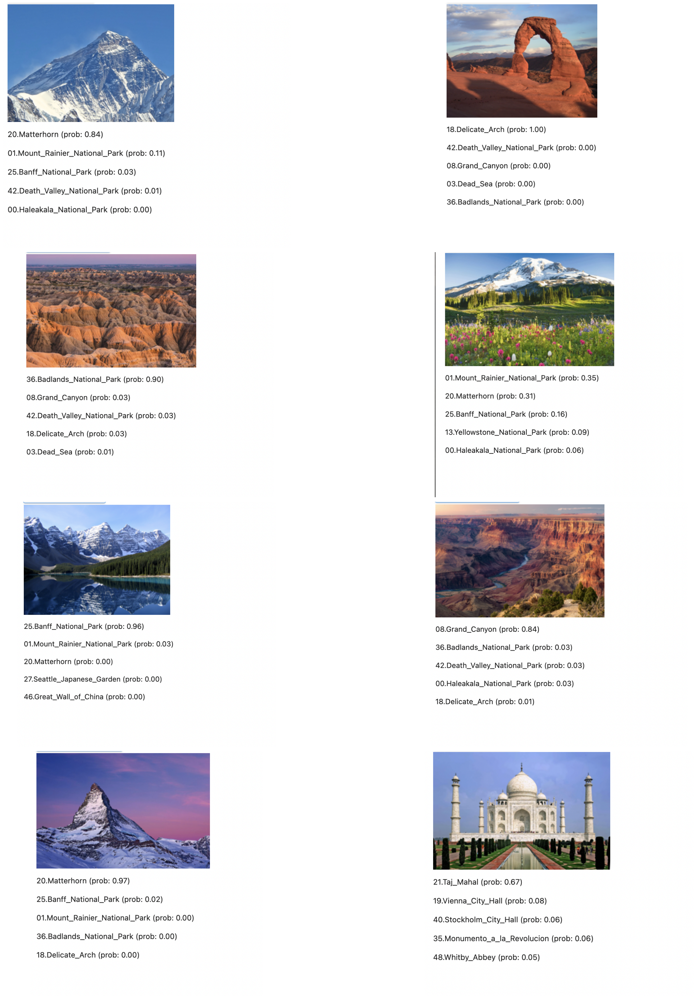

In [49]:
plot_inferences("/Users/yuniktamrakar/Desktop/ML-Final-Inferences")

From the inferences above, we can see our model obtained from transfer learning performs very well on the images, making accurate predictions 7/8 times. The only incorrect inference is for the image of Mount Everest. However, this is to be expected as the images of Mount Everest has not been included during training. Nonetheless, the top 3 predictions made by the model include Matterhorn, Banff and Mt. Rainier, which are all mountain landscapes. Thus, we may infer that the model learnt the features pretty well.

The predictions, as compared to the previous model are much better. The previous model mistook Taj Mahal as some architectural feature and also, suggested that Everest could be Eiffel tower (2nd prediction). This transfer model does not make the same mistakes. What I found pretty impressive was that this model could distinguish between Badlands and the Grand canyon, which might be a slight challenge, even for humans.

### Transfer Learning Continued. Let's use VGG-16

In [24]:
%%file src/transfer_general.py
import torch
import torchvision
import torchvision.models as models
import torch.nn as nn

def get_model_transfer_learning(model_name="resnet18", n_classes=57):
    # Get the requested architecture
    if hasattr(models, model_name):
        # Load model with default weights
        if "resnet" in model_name:
            model_transfer = getattr(models, model_name)(weights='ResNet18_Weights.DEFAULT')
        elif "vgg" in model_name:
            model_transfer = getattr(models, model_name)(weights='VGG16_Weights.DEFAULT')
        else:
            raise ValueError(f"Unsupported model type for {model_name}")
    else:
        torchvision_major_minor = ".".join(torchvision.__version__.split(".")[:2])
        raise ValueError(f"Model {model_name} is not known. List of available models: "
                         f"https://pytorch.org/vision/{torchvision_major_minor}/models.html")

    # Freeze all parameters in the model
    for param in model_transfer.parameters():
        param.requires_grad = False

    # Modify the classifier layer based on model architecture
    if "resnet" in model_name:
        num_ftrs = model_transfer.fc.in_features
        model_transfer.fc = nn.Linear(num_ftrs, n_classes)
    elif "vgg" in model_name:
        num_ftrs = model_transfer.classifier[6].in_features
        model_transfer.classifier[6] = nn.Linear(num_ftrs, n_classes)

    return model_transfer




Overwriting src/transfer_general.py


In [25]:
batch_size = 64  # size of the minibatch for stochastic gradient descent (or Adam)
valid_size = 0.2  # fraction of the training data to reserve for validation
num_epochs = 70  # number of epochs for training
num_classes = 57  # number of classes. Do not change this
learning_rate = 0.001  # Learning rate for SGD (or Adam)
opt = 'adam'      # optimizer. 'sgd' or 'adam'
weight_decay = 0.001 # regularization. Increase this to combat overfitting

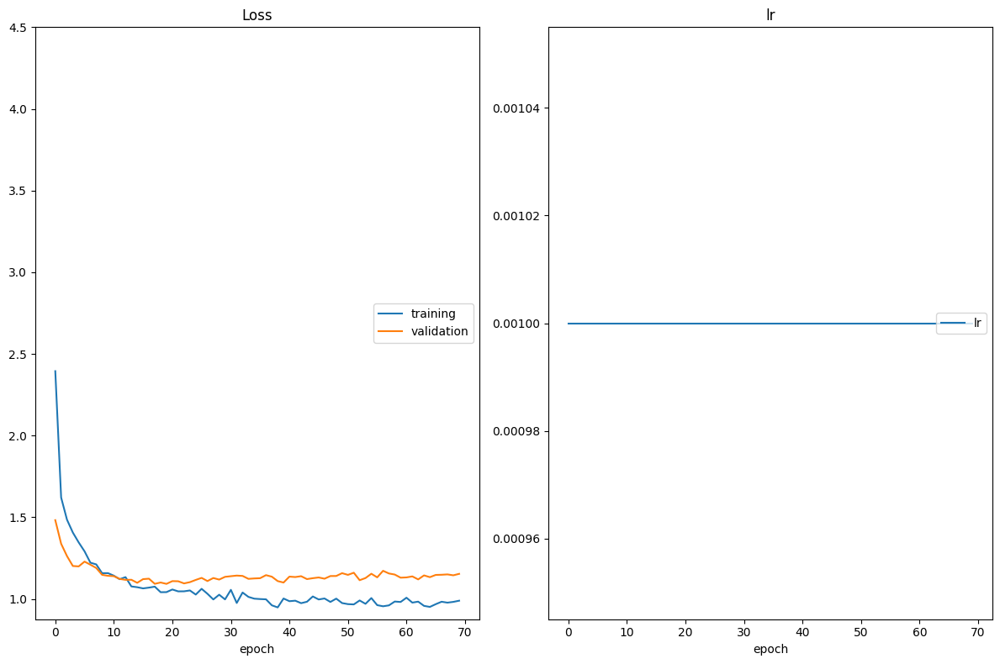

In [27]:
from src.data import get_data_loaders
from src.optimization import get_optimizer, get_loss
from src.train import optimize
from src.transfer_general import get_model_transfer_learning

# Get a model using get_model_transfer_learning. Use one of the names reported here:
# https://pytorch.org/vision/0.10/models.html
# For example, if you want to load ResNet 18, use "resnet18"
# NOTE: use the hyperparameters defined in the previous cell, do NOT copy/paste the
# values
model_transfer = get_model_transfer_learning("vgg16") 

# train the model
data_loaders = get_data_loaders(batch_size=batch_size)
optimizer = get_optimizer(
    model_transfer,
    learning_rate=learning_rate,
    optimizer=opt,
    weight_decay=weight_decay,
)
loss = get_loss()

optimize(
    data_loaders,
    model_transfer,
    optimizer,
    loss,
    n_epochs=num_epochs,
    save_path="checkpoints/model_transfer_vgg.pt",
    interactive_tracking=True
)

In [38]:
import torch
from src.train import one_epoch_test
from src.transfer_general import get_model_transfer_learning

model_transfer = get_model_transfer_learning("vgg16", n_classes=num_classes)
# Load saved weights
model_transfer.load_state_dict(torch.load('checkpoints/model_transfer_vgg.pt'))

one_epoch_test(data_loaders['test'], model_transfer, loss)

Testing: 100%|██████████████████████████████████| 23/23 [01:34<00:00,  4.12s/it]

Test Loss: 1.051462


Test Accuracy: 73% (1044/1425)


1.0514618002850076

In [39]:
from src.predictor import Predictor
from src.helpers import compute_mean_and_std

# First let's get the class names from our data loaders
class_names = data_loaders["train"].dataset.classes

# Then let's move the model_transfer to the CPU
# (we don't need GPU for inference)
model_transfer = model_transfer.cpu()
# Let's make sure we use the right weights by loading the
# best weights we have found during training
# NOTE: remember to use map_location='cpu' so the weights
# are loaded on the CPU (and not the GPU)
model_transfer.load_state_dict(
    torch.load("checkpoints/model_transfer_vgg.pt", map_location="cpu")
)

# Let's wrap our model using the predictor class
mean, std = compute_mean_and_std()
predictor = Predictor(model_transfer, class_names, mean, std).cpu()

# Export using torch.jit.script
scripted_predictor = torch.jit.script(predictor)
scripted_predictor.save("checkpoints/transfer_exported_vgg.pt")

Reusing cached mean and std


In [2]:
from src.data import get_data_loaders
data_loaders = get_data_loaders(batch_size=64)

Reusing cached mean and std
Dataset mean: tensor([0.4696, 0.4770, 0.4705]), std: tensor([0.2678, 0.2682, 0.2961])


100%|███████████████████████████████████████| 1425/1425 [01:49<00:00, 13.02it/s]


Accuracy: 0.7333333333333333


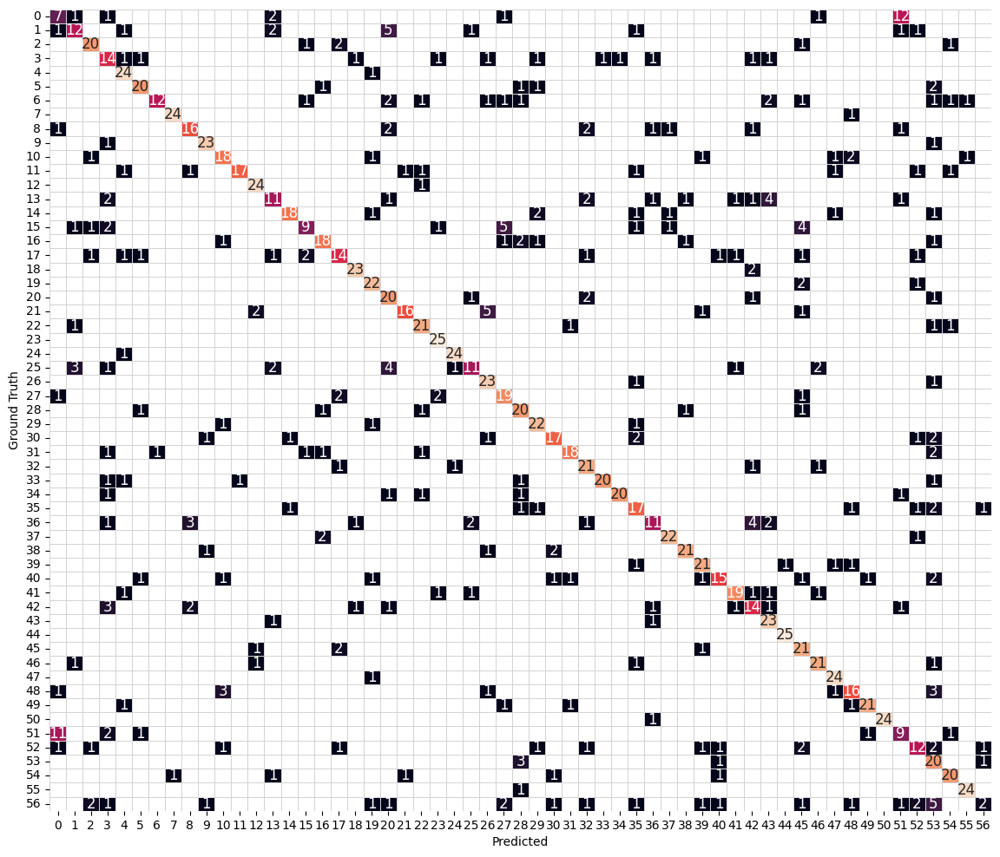

In [3]:
import torch
from src.predictor import predictor_test
from src.helpers import plot_confusion_matrix

model_reloaded = torch.jit.load("checkpoints/transfer_exported_vgg.pt")

pred, truth = predictor_test(data_loaders['test'], model_reloaded)

plot_confusion_matrix(pred, truth)

### Let's try transfer learning on even more models

In [29]:
%%file src/transfer_all_models.py
import torchvision.models as models
import torch.nn as nn


def get_model_transfer_learning(model_name="resnet18", n_classes=57):
    # Dynamically load the model with pretrained weights
    if hasattr(models, model_name):
        ModelClass = getattr(models, model_name)
        try:
            # Attempt to load default weights, if available
            model_transfer = ModelClass(weights=ModelClass.Weights.DEFAULT)
        except AttributeError:
            # If default weights aren't specified, fall back to pretrained=True
            model_transfer = ModelClass(pretrained=True)
    else:
        raise ValueError(f"Model {model_name} is not available in torchvision.")

    # Freeze all parameters in the model
    for param in model_transfer.parameters():
        param.requires_grad = False

    # Classifier modification depends on the architecture
    if 'resnet' in model_name or 'vgg' in model_name:
        num_ftrs = model_transfer.fc.in_features if 'resnet' in model_name else model_transfer.classifier[6].in_features
        model_transfer.fc = nn.Linear(num_ftrs, n_classes) if 'resnet' in model_name else nn.Linear(num_ftrs, n_classes)
    elif 'densenet' in model_name:
        num_ftrs = model_transfer.classifier.in_features
        model_transfer.classifier = nn.Linear(num_ftrs, n_classes)
    elif 'googlenet' in model_name:
        num_ftrs = model_transfer.fc.in_features
        model_transfer.fc = nn.Linear(num_ftrs, n_classes)
    elif 'mobilenet' in model_name:
        num_ftrs = model_transfer.classifier[-1].in_features
        model_transfer.classifier[-1] = nn.Linear(num_ftrs, n_classes)
    elif 'alexnet' in model_name:
        num_ftrs = model_transfer.classifier[6].in_features
        model_transfer.classifier[6] = nn.Linear(num_ftrs, n_classes)
    else:
        raise NotImplementedError(f"Model type {model_name} not implemented for classifier modification.")

    return model_transfer


Writing src/transfer_all_models.py


In [30]:
batch_size = 64  # size of the minibatch for stochastic gradient descent (or Adam)
valid_size = 0.2  # fraction of the training data to reserve for validation
num_epochs = 70  # number of epochs for training
num_classes = 57  # number of classes. Do not change this
learning_rate = 0.001  # Learning rate for SGD (or Adam)
opt = 'adam'      # optimizer. 'sgd' or 'adam'
weight_decay = 0.001 # regularization. Increase this to combat overfitting

### MobileNet-v3

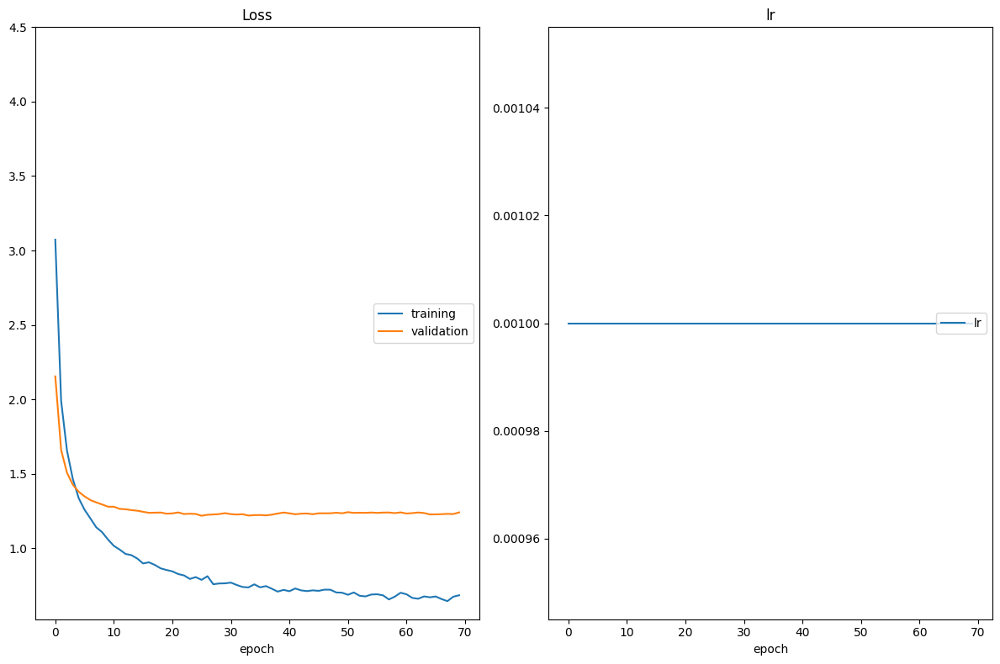

In [32]:
from src.data import get_data_loaders
from src.optimization import get_optimizer, get_loss
from src.train import optimize
from src.transfer_all_models import get_model_transfer_learning

# Get a model using get_model_transfer_learning. Use one of the names reported here:
# https://pytorch.org/vision/0.10/models.html
# For example, if you want to load ResNet 18, use "resnet18"
# NOTE: use the hyperparameters defined in the previous cell, do NOT copy/paste the
# values
model_transfer = get_model_transfer_learning("mobilenet_v3_small") 

# train the model
data_loaders = get_data_loaders(batch_size=batch_size)
optimizer = get_optimizer(
    model_transfer,
    learning_rate=learning_rate,
    optimizer=opt,
    weight_decay=weight_decay,
)
loss = get_loss()

optimize(
    data_loaders,
    model_transfer,
    optimizer,
    loss,
    n_epochs=num_epochs,
    save_path="checkpoints/model_transfer_mobile.pt",
    interactive_tracking=True
)

In [40]:
import torch
from src.train import one_epoch_test
from src.transfer_all_models import get_model_transfer_learning

model_transfer = get_model_transfer_learning("mobilenet_v3_small", n_classes=num_classes)
# Load saved weights
model_transfer.load_state_dict(torch.load('checkpoints/model_transfer_mobile.pt'))

one_epoch_test(data_loaders['test'], model_transfer, loss)

Testing: 100%|██████████████████████████████████| 23/23 [00:31<00:00,  1.36s/it]

Test Loss: 1.116076


Test Accuracy: 73% (1046/1425)


1.1160761040189993

In [41]:
from src.predictor import Predictor
from src.helpers import compute_mean_and_std

# First let's get the class names from our data loaders
class_names = data_loaders["train"].dataset.classes

# Then let's move the model_transfer to the CPU
# (we don't need GPU for inference)
model_transfer = model_transfer.cpu()
# Let's make sure we use the right weights by loading the
# best weights we have found during training
# NOTE: remember to use map_location='cpu' so the weights
# are loaded on the CPU (and not the GPU)
model_transfer.load_state_dict(
    torch.load("checkpoints/model_transfer_mobile.pt", map_location="cpu")
)

# Let's wrap our model using the predictor class
mean, std = compute_mean_and_std()
predictor = Predictor(model_transfer, class_names, mean, std).cpu()

# Export using torch.jit.script
scripted_predictor = torch.jit.script(predictor)
scripted_predictor.save("checkpoints/transfer_exported_mobile_v3_small.pt")

Reusing cached mean and std


100%|███████████████████████████████████████| 1425/1425 [03:27<00:00,  6.88it/s]


Accuracy: 0.7298245614035088


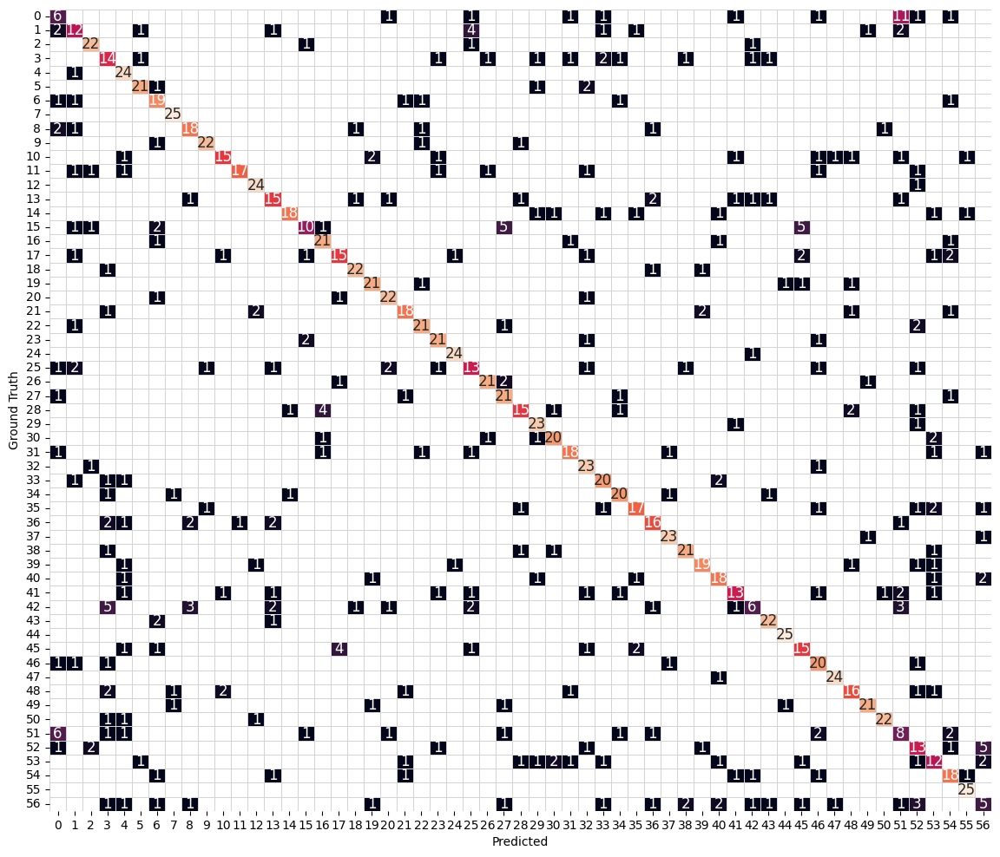

In [4]:
import torch
from src.predictor import predictor_test
from src.helpers import plot_confusion_matrix

model_reloaded = torch.jit.load("checkpoints/transfer_exported_mobile_v3_small.pt")

pred, truth = predictor_test(data_loaders['test'], model_reloaded)

plot_confusion_matrix(pred, truth)

### Comparing performance of the various trained models

| Model | Test Accuracy | Loss |
|----------|----------|----------|
| Resnet-18 |  70% (1011/1425) | 1.177942 |
| VGG-16 | 73% (1044/1425) | 1.051462 |
| MobileNet-Small-v3 | 73% (1046/1425) | 1.1160761040189993 |
| Custom | 51% (727/1425) | 2.078365


### Deploy this app on localhost

Running the following block will deploy the app on localhost, port 8866.

In [32]:
!voila app_transfer.ipynb --show_tracebacks=True

[Voila] Using /var/folders/dl/cs1nq3qs437gw0zqqgdzx1980000gn/T to store connection files
[Voila] Storing connection files in /var/folders/dl/cs1nq3qs437gw0zqqgdzx1980000gn/T/voila_gupzx49e.
[Voila] Serving static files from /Users/yuniktamrakar/.pyenv/versions/3.10.3/lib/python3.10/site-packages/voila/static.
[Voila] Voilà is running at:
http://localhost:8866/
[Voila] WARNING | Clearing invalid/expired login cookie username-localhost-8866
[Voila] Kernel started: 66afd839-ee36-48af-9800-6c4c6c635d5a
[Voila] Connecting to kernel 66afd839-ee36-48af-9800-6c4c6c635d5a.
^C
[Voila] Stopping...
[Voila] Kernel shutdown: 66afd839-ee36-48af-9800-6c4c6c635d5a


## Results and Lessons

TODO

## Conclusions

TODO

### References

* Weyand, T., Araujo, A., Cao, B., & Sim, J. (2020). Google landmarks dataset v2-a large-scale benchmark for instance-level recognition and retrieval. In Proceedings of the IEEE/CVF conference on computer vision and pattern recognition (pp. 2575-2584).
* Lv, J. J., Shao, X. H., Huang, J. S., Zhou, X. D., & Zhou, X. (2017). Data augmentation for face recognition. Neurocomputing, 230, 184-196.
* This project derives its overall project structure as well as various modules from the Udacity Deep Learning Nanodegree capstone codebase
* https://towardsdatascience.com/a-guide-to-an-efficient-way-to-build-neural-network-architectures-part-ii-hyper-parameter-42efca01e5d7
* Krizhevsky, A., Sutskever, I., & Hinton, G. E. (2012). Imagenet classification with deep convolutional neural networks. Advances in neural information processing systems, 25.
* ChatGPT (I asked ChatGPT a bunch of questions when I initally struggled to improve my accuracy above 50%. It provided convincing responses, but ultimately didn't suggest the one thing that actually worked for me. It's still got work to do before it catches up with humans in some aspects of problem solving)
